In [1]:
import shutil
import pandas as pd
import numpy as np
from bifacial_peak_shaving import *
from data_processing import *
pd.options.plotting.backend='plotly'

# Data

In [11]:
#data_dir = r'~/OneDrive/Data'
data_dir = r'C:/Users/Admin/OneDrive - Politecnico di Milano/Data'

output_filename_stub = r'Output/caltech_ev_mjw10_solar0.5x__'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29184 entries, 2018-05-01 00:00:00 to 2019-02-28 23:45:00
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  29184 non-null  float64
dtypes: float64(1)
memory usage: 456.0 KB
None
          Load (kW)
count  29184.000000
mean      21.240250
std       20.452856
min        0.000000
25%        4.942236
50%       14.632581
75%       33.154909
max      117.733400


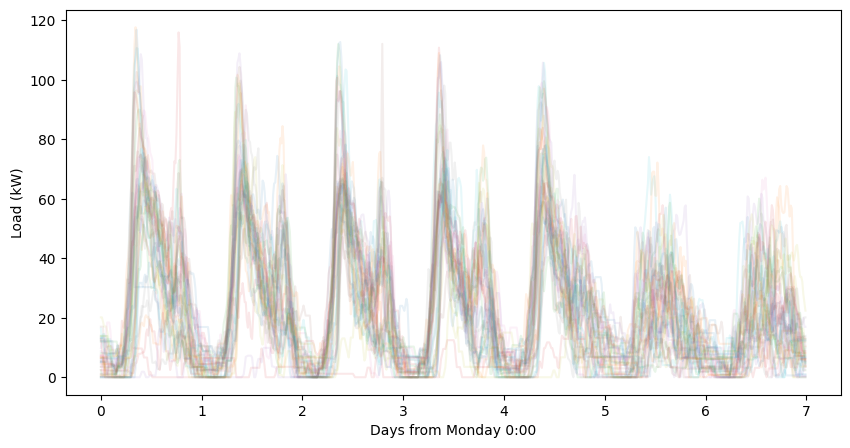

<Axes: xlabel='Datetime (PST)'>

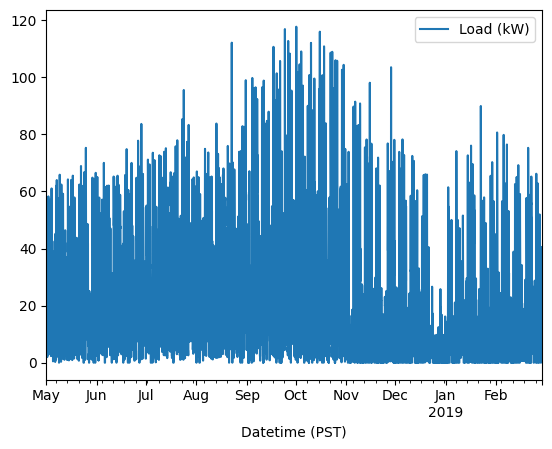

In [12]:
load_file = r'/Load/Vehicle/ACN/old/acn_caltech.csv'

#shutil.copyfile(data_dir+load_file, r'./Data/'+load_file.split('/')[-1])

load = pd.read_csv(data_dir + r'/Load/Vehicle/ACN/old/acn_caltech.csv',
                   index_col=0,
                   parse_dates=True,
                   comment='#',)
                    #.resample('1h').mean()\
                    #.fillna(method='ffill')
                    #.loc['2018-4-26':'2019-3-22']
#load = pd.DataFrame({'Load (kW)':list(load.loc['2019-1-2 0:00':'2019-1-2 16:00','Load (kW)'])+list(load.loc[:,'Load (kW)'])},
#                     index=pd.date_range('2019-1-1 0:00',periods=8760,freq='1h'))
#load.loc['2019-5-20'] = load.loc['2019-5-22'].values
#load.loc['2019-5-21'] = load.loc['2019-5-22'].values
#load.index = pd.date_range('1901-1-1 0:00',periods=35040,freq='15min')
load = load.fillna(method='ffill')
#interval_min = int(load.index.to_series().diff().mean().seconds/60)
#load = load.resample('30min').mean()
load = load.loc['2018-5-1':'2019-2-28']
print(load.info())
print(load.describe())

# upsample
# load = load.resample('5min').interpolate(method='linear')
# load.loc[len(load)] = [pd.NA]
# load.index = list(load.index[:-1]) + [load.index[-2]+pd.Timedelta('5min')]
# load.loc[len(load)] = [pd.NA]
# load.index = list(load.index[:-1]) + [load.index[-2]+pd.Timedelta('5min')]
# load = load.fillna(method='ffill')

plot_weekly(load['Load (kW)'])
load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [7]:
solar_angles = ['s20','w90','s20w90']

dir_solar = data_dir + r'/Solar/Modelled/'

s20 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_s20.csv',index_col=0,parse_dates=True,comment='#'),
                 pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_s20.csv',index_col=0,parse_dates=True,comment='#')))

w90 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_w90.csv',index_col=0,parse_dates=True,comment='#'),
                 pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_w90.csv',index_col=0,parse_dates=True,comment='#')))

s20w90 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_s20w90.csv',index_col=0,parse_dates=True,comment='#'),
                    pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_s20w90.csv',index_col=0,parse_dates=True,comment='#')))

solar = pd.concat((s20,w90,s20w90),axis=1)
solar.columns=solar_angles

#solar = solar.resample('1h').mean()



#net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()) # load=production / yield
#solar = solar * net_zero_capacity # scale to net 0


# upsample
# solar = solar.resample('5min').interpolate(method='linear')
# for _ in range(2):
#     solar.loc[len(solar)] = [pd.NA]*len(solar.columns)
#     solar.index = list(solar.index[:-1]) + [solar.index[-2]+pd.Timedelta('5min')]
# solar = solar.fillna(method='ffill')

solar = solar.loc[load.index] # make same length as load

solar = solar * 0.5 # double or nuthin!

print(solar.info(),'\n')
print(solar.describe())
solar

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29184 entries, 2018-05-01 00:00:00 to 2019-02-28 23:45:00
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   s20     29184 non-null  float64
 1   w90     29184 non-null  float64
 2   s20w90  29184 non-null  float64
dtypes: float64(3)
memory usage: 912.0 KB
None 

                s20           w90        s20w90
count  29184.000000  29184.000000  29184.000000
mean      10.394018      8.972441      9.667595
std       14.438968     12.007878     12.189922
min       -0.033646     -0.027936     -0.032053
25%       -0.004077     -0.004077     -0.004077
50%       -0.004077     -0.004077     -0.004077
75%       22.445587     17.894350     22.102587
max       53.416500     43.746200     40.116950


,s20,w90,s20w90
Datetime (PST),,,
2018-05-01 00:00:00,-0.004077,-0.004077,-0.004077
2018-05-01 00:15:00,-0.004077,-0.004077,-0.004077
2018-05-01 00:30:00,-0.004077,-0.004077,-0.004077
2018-05-01 00:45:00,-0.004077,-0.004077,-0.004077
2018-05-01 01:00:00,-0.004077,-0.004077,-0.004077
...,...,...,...
2019-02-28 22:45:00,-0.004077,-0.004077,-0.004077
2019-02-28 23:00:00,-0.004077,-0.004077,-0.004077
2019-02-28 23:15:00,-0.004077,-0.004077,-0.004077


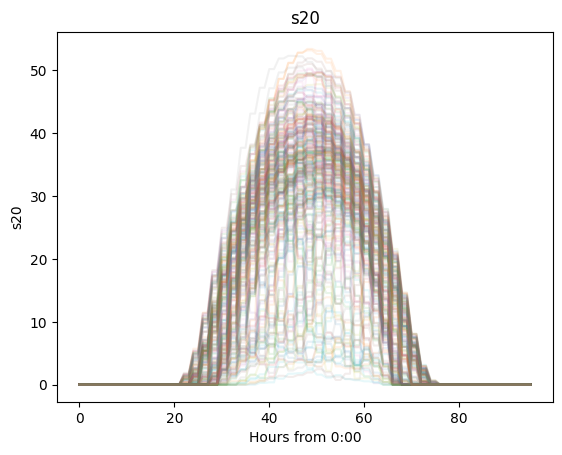

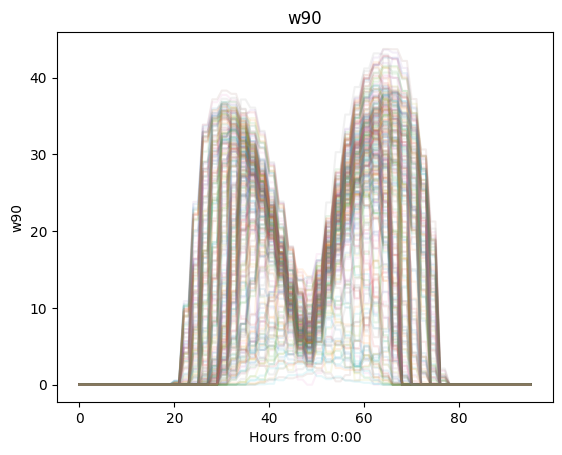

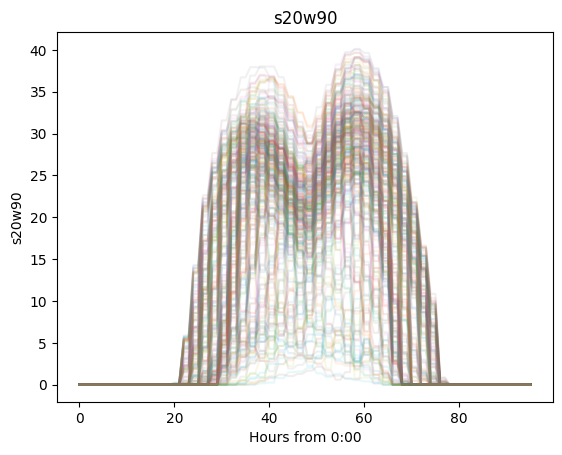

In [8]:
for col in solar:
    plot_daily(solar[col],title=col,interval_min=15)

## Net load

In [9]:
solar.index = load.index # seems unnecessary
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]

load v s20

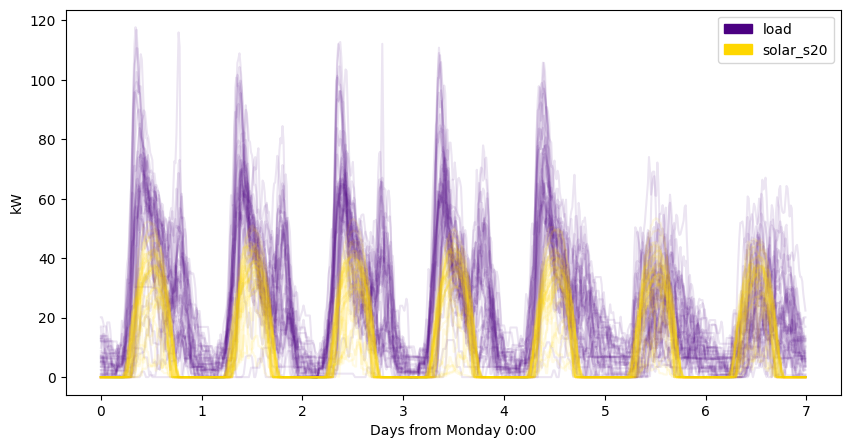

In [10]:
l = df['load']
s = df['solar_s20']
plot_weekly((l,s),ylabel='kW')

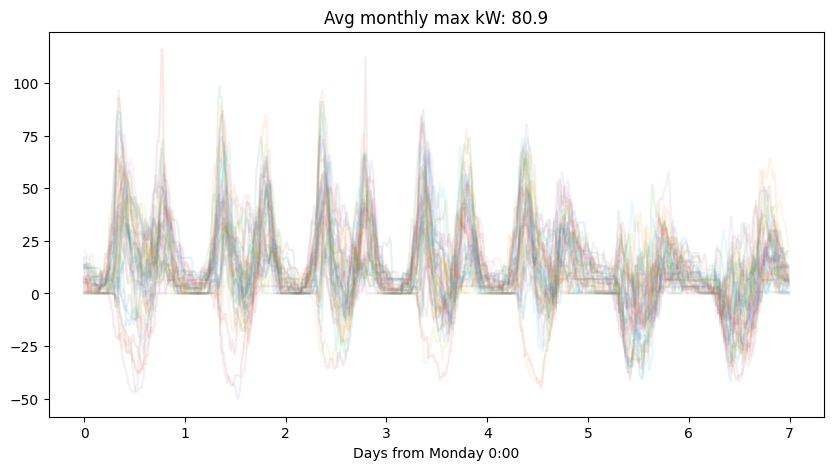

In [11]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

In [12]:
# l = df['load']
# s = df['solar_w20']
#avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
# plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

In [13]:
# l = df['load']
# s = df['solar_w20']
# avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
# plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

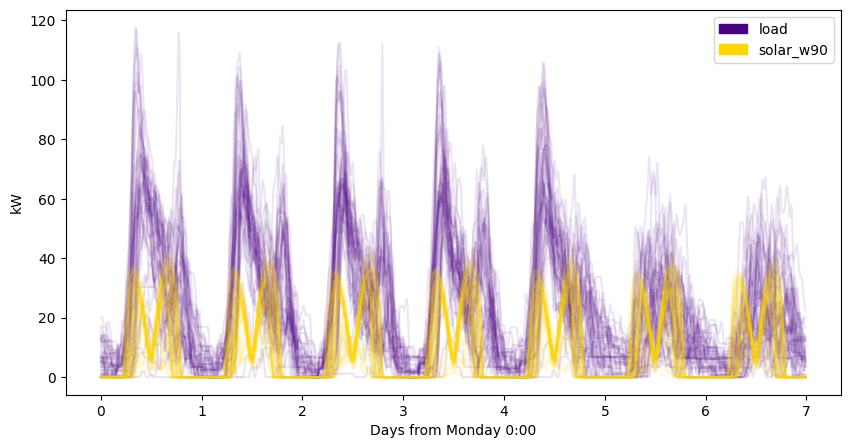

In [14]:
l = df['load']
s = df['solar_w90']
plot_weekly((l,s),ylabel='kW')

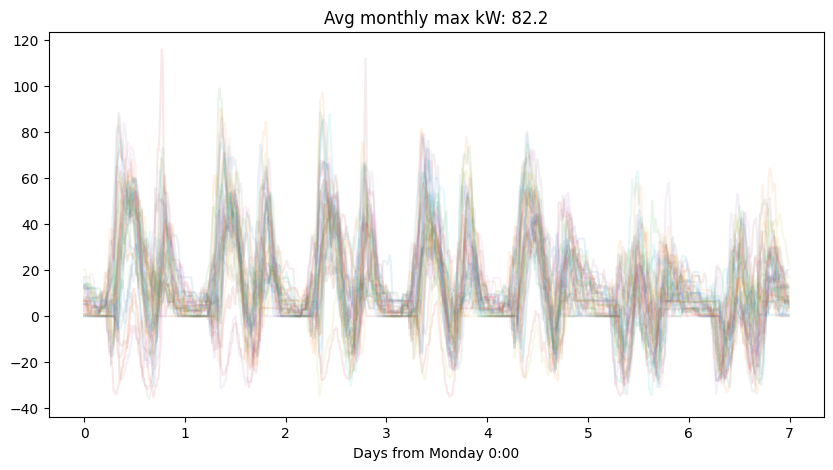

In [15]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

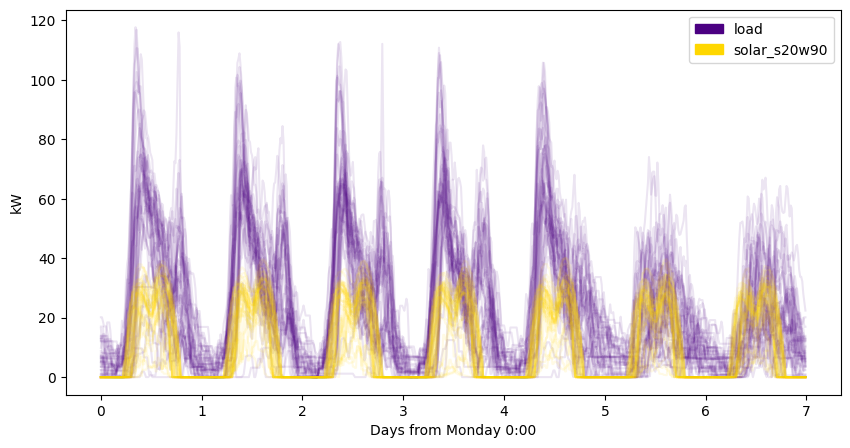

In [16]:
l = df['load']
s = df['solar_s20w90']
plot_weekly((l,s),ylabel='kW')

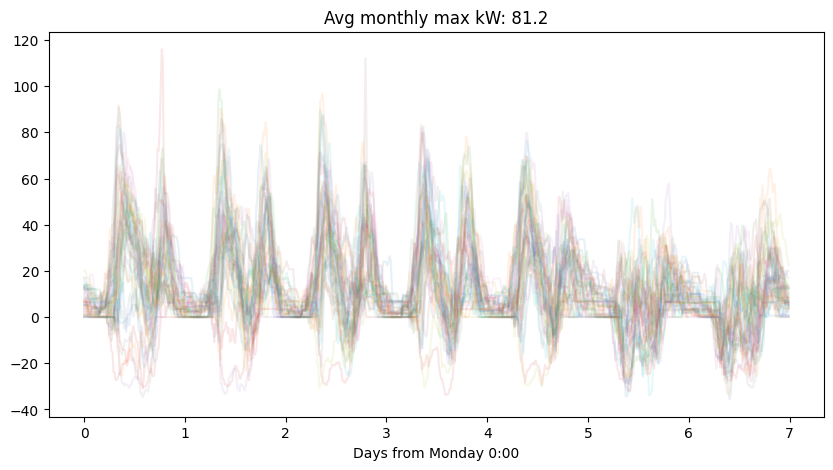

In [17]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Baseline costs

Load only, and net load given various solar

In [18]:
real_TOU = [  {'price':26.07, 'hours':list(range(24)) },
              {'price': 6.81, 'hours':list(range(14,16))+list(range(21,23))},
              {'price':32.90, 'hours':list(range(16,21))}]

In [19]:
all_cost = {}

# # load
# cost = 0
# for year in df.index.year.unique():
#     df_year = df[df.index.year==year]
#     for month in df_year.index.month.unique():
#         df_month = df_year[df_year.index.month==month]
#         cost += calc_power_cost(df_month['load'],real_TOU)
# all_cost['load'] = round(cost,0)

# # net load for each solar case

load_cols = ['load'] + [f'netload_{angle}' for angle in solar_angles]

for load_col in load_cols:
    cost = 0
    for year in df.index.year.unique():
        df_year = df[df.index.year==year]
        for month in df_year.index.month.unique():
            df_month = df_year[df_year.index.month==month]
            cost += calc_power_cost(df_month[load_col],real_TOU)
    all_cost[load_col] = round(cost,0)

all_cost

{'load': 44467.0,
 'netload_s20': 38668.0,
 'netload_w90': 38893.0,
 'netload_s20w90': 38606.0}

# Monthly peaks

## Single TOU

In [20]:
df

,load,solar_s20,solar_w90,solar_s20w90,netload_s20,netload_w90,netload_s20w90
Datetime (PST),,,,,,,
2018-05-01 00:00:00,3.013458,-0.004077,-0.004077,-0.004077,3.017535,3.017535,3.017535
2018-05-01 00:15:00,3.013458,-0.004077,-0.004077,-0.004077,3.017535,3.017535,3.017535
2018-05-01 00:30:00,3.013458,-0.004077,-0.004077,-0.004077,3.017535,3.017535,3.017535
2018-05-01 00:45:00,3.013458,-0.004077,-0.004077,-0.004077,3.017535,3.017535,3.017535
2018-05-01 01:00:00,3.013458,-0.004077,-0.004077,-0.004077,3.017535,3.017535,3.017535
...,...,...,...,...,...,...,...
2019-02-28 22:45:00,4.867047,-0.004077,-0.004077,-0.004077,4.871125,4.871125,4.871125
2019-02-28 23:00:00,4.867047,-0.004077,-0.004077,-0.004077,4.871125,4.871125,4.871125
2019-02-28 23:15:00,4.867047,-0.004077,-0.004077,-0.004077,4.871125,4.871125,4.871125


In [21]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)
peaks

,netload_s20 kw,netload_s20 t
0,63.8,2018-05-25 09:00:00
1,53.1,2018-06-06 08:15:00
2,78.7,2018-07-24 09:15:00
3,72.9,2018-08-31 08:45:00
4,93.1,2018-09-24 08:15:00
5,98.3,2018-10-09 08:15:00
6,68.8,2018-11-08 10:15:00
7,72.5,2018-12-06 09:45:00
8,66.8,2019-01-17 10:30:00
9,71.9,2019-02-05 10:30:00


In [22]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

# angle = 'w20'
# peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
# peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

#print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w90 reduction -1.120000000000001
Avg s20w90 reduction -0.13999999999999843


,netload_s20 kw,netload_s20 t,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
0,63.8,2018-05-25 09:00:00,66.1,2018-05-25 09:00:00,-2.3,65.0,2018-05-25 09:00:00,-1.2
1,53.1,2018-06-06 08:15:00,54.5,2018-06-06 08:15:00,-1.4,53.8,2018-06-06 08:15:00,-0.7
2,78.7,2018-07-24 09:15:00,70.7,2018-07-24 09:15:00,8.0,74.8,2018-07-24 09:15:00,3.9
3,72.9,2018-08-31 08:45:00,69.0,2018-08-31 10:00:00,3.9,70.0,2018-08-31 09:00:00,2.9
4,93.1,2018-09-24 08:15:00,88.5,2018-09-24 08:15:00,4.6,90.8,2018-09-24 08:15:00,2.3
5,98.3,2018-10-09 08:15:00,99.0,2018-10-09 08:15:00,-0.7,98.7,2018-10-09 08:15:00,-0.4
6,68.8,2018-11-08 10:15:00,87.9,2018-11-28 10:30:00,-19.1,75.3,2018-11-28 10:30:00,-6.5
7,72.5,2018-12-06 09:45:00,72.7,2018-12-06 09:45:00,-0.2,72.6,2018-12-06 09:45:00,-0.1
8,66.8,2019-01-17 10:30:00,69.0,2019-01-16 10:30:00,-2.2,67.5,2019-01-16 10:30:00,-0.7
9,71.9,2019-02-05 10:30:00,73.7,2019-02-05 10:30:00,-1.8,72.8,2019-02-05 10:30:00,-0.9


## Variable TOU

BROKEN!

w20

In [23]:
# angle1 = 's20'
# angle2 = 'w20'

# peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
# peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.1]

w90

In [ ]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>5]

s20w90

In [ ]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>2]

Best for w90

In [52]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [53]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [54]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

In [ ]:
angle = 's20'
thresholds = (21.6,21.6,0.0)
batt_kwh = 100
peak_begin,peak_end = 16,18
year_month = '2018-6'

TOU = [{'price':26.07, 'hours':list(range(24)) },
       {'price':6.81,  'hours':list(range(14,peak_begin))+list(range(peak_end,23))},
       {'price':32.90, 'hours':list(range(peak_begin,peak_end))}]
fail,dispatch = peak_shaving_sim(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc[year_month],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   TOU,
                                   utility_chg_max=batt_kwh,)

cost = calc_power_cost(dispatch.utility,TOU)

plotly_stacked( dispatch.drop(columns=['soc']),
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=TOU[0]['hours'],                     
                threshold1=thresholds[1], threshold1_h=TOU[1]['hours'],
                threshold2=thresholds[2], threshold2_h=TOU[2]['hours'],                                
                title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                size=(800,400),
                #upsample_min=1,
                )

In [ ]:
angle = 'w90'
thresholds = (13.03,13.03,0.0)
batt_kwh = 100
peak_begin,peak_end = 16,18
year_month = '2018-6'


TOU = [{'price':26.07, 'hours':list(range(24)) },
       {'price':6.81,  'hours':list(range(14,peak_begin))+list(range(peak_end,23))},
       {'price':32.90, 'hours':list(range(peak_begin,peak_end))}]
fail,dispatch = peak_shaving_sim(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc[year_month],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   TOU,
                                   utility_chg_max=batt_kwh,)

cost = calc_power_cost(dispatch.utility,TOU)

plotly_stacked( dispatch.drop(columns=['soc']),
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=TOU[0]['hours'],                     
                threshold1=thresholds[1], threshold1_h=TOU[1]['hours'],
                threshold2=thresholds[2], threshold2_h=TOU[2]['hours'],                                
                title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                size=(800,400),
                #upsample_min=1,
                )

## Minimize cost

Grid search rough, fine, and gradient descent

In [24]:
TEST = False

angles = ['s20','w90','s20w90']
batt_kwhs = [25,50,75,100,125,150,200,400,600]
peak_begin,peak_end = 16,18
year_months = [f'{y}-{m}' for y in df.index.year.unique() for m in df.loc[str(y)].index.month.unique()]

TOU = [{'price':26.07,      'hours':list(range(24)) },
       {'price': 6.81,      'hours':list(range(14,peak_begin))+list(range(peak_end,23))},
       {'price':32.90,      'hours':list(range(peak_begin,peak_end))}]

if TEST == True: angles, batt_kwhs, year_months = angles[:2], batt_kwhs[:1], year_months[1:2]

rough_search_max = 100
rough_step = 10

tic = pd.Timestamp.now()

output = pd.DataFrame([],columns=['angle','batt kwh','total cost']+year_months)
for batt_kwh in batt_kwhs:
    for angle in angles:
        best_monthly = pd.DataFrame([],columns=['year-month','threshold0','threshold1','threshold2','cost'])
        for year_month in year_months:
            _df = df.loc[year_month][['load',f'solar_{angle}',f'netload_{angle}']]
            t_newmonth = pd.Timestamp.now()
            print(f'\n{t_newmonth} Angle {angle} batt_kwh {batt_kwh } begin new month {year_month}')
            
            r = pd.DataFrame([], columns=['i','fail','th0','th1','th2','c','deltac','dc'])
            
            #
            # Rough grid search
            #
            
            k = 0
            for th0 in range(0,rough_search_max,rough_step):
                for th1 in range(0,rough_search_max,rough_step):
                    th1 = min(th0,th1)
                    for th2 in range(0,rough_search_max,rough_step):
                        k += 1
                        fail,dispatch = peak_shaving_sim(   _df,
                                                            f'netload_{angle}',
                                                            batt_kwh,
                                                            [th0,th1,th2],
                                                            TOU,
                                                            utility_chg_max=batt_kwh,)                
                        #if fail == False:
                        cost = calc_power_cost(dispatch.utility,TOU)
                        r.loc[len(r)] = [k,fail,th0,th1,th2,cost,pd.NA,pd.NA]
            
            if len(r) > 0:
                best_cost = r[r.fail==False]['c'].min()
                imin = r[r.fail==False]['c'].idxmin()
                best_th0 = r.loc[imin].th0
                best_th1 = r.loc[imin].th1
                best_th2 = r.loc[imin].th2
            else: 
                print(f'\n\n\n /// No viable solutions for angle {angle} batt_kwh {batt_kwh} year-month {year_month} rough_search_max {rough_search_max}/// \n\n\n')
                break
            
            t_rgs = pd.Timestamp.now()
            dt = (t_rgs - t_newmonth).seconds
            print(f'{t_rgs} (+{dt}s) Rough grid search done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')


            #
            # Fine grid search
            #

            for th0 in range(max(0,int(best_th0-rough_step)),int(best_th0+rough_step+1),3):
                for th1 in range(max(0,int(best_th1-rough_step)),int(best_th1+rough_step+1),3):
                    th1 = min(th0,th1)
                    for th2 in range(max(0,int(best_th2-rough_step)),int(best_th2+rough_step)):                        
                        k += 1
                        fail,dispatch = peak_shaving_sim(   _df,
                                                            f'netload_{angle}',
                                                            batt_kwh,
                                                            [th0,th1,th2],
                                                            TOU,
                                                            utility_chg_max=batt_kwh,)                
                        #if fail == False:
                        cost = calc_power_cost(dispatch.utility,TOU)
                        r.loc[len(r)] = [k,fail,th0,th1,th2,cost,pd.NA,pd.NA]
            
            best_cost = r[r.fail==False]['c'].min()
            imin = r[r.fail==False]['c'].idxmin()
            best_th0 = r.loc[imin].th0
            best_th1 = r.loc[imin].th1
            best_th2 = r.loc[imin].th2
            
            t_fgs = pd.Timestamp.now()
            dt = (t_fgs - t_rgs).seconds
            print(f'{t_fgs} (+{dt}s) Fine grid search done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
            
            #
            # Gradient descent
            #                

            LR = (0.1,0.1,0.1)
            
            c = []
            th = [[best_th0,best_th1,best_th2]]
            cost,fail,dispatch = f(th[0],_df,angle,batt_kwh,TOU)
            c.append(cost)
            
            #final_countdown = 20
            cmin = cost
            patience_counter = 0
            for i in range(1,500):
                dc = grad_f(th[i-1],_df,angle,batt_kwh,TOU)                     # dy
                dth = [(dx+nz)*lr for dx,lr,nz in zip(dc,LR,np.random.rand(3))] # dx
                new_th = [max(0,x+dx) for x,dx in zip(th[i-1],dth)]             # x2 = x1 + dx
                new_th[1] = min(new_th[0],new_th[1])                            # all th1 <= th0
                new_th[2] = min(new_th[0],new_th[2])                            # all th2 <= th1
                th.append(new_th)
                cost,fail,dispatch = f(th[i],_df,angle,batt_kwh,TOU)                  
                c.append(cost)
                
                r.loc[len(r)] = [i+k, # k from rough/fine searches
                                fail,
                                round(th[i][0],3),
                                round(th[i][1],3),
                                round(th[i][2],3),
                                c[i],
                                c[i]-c[i-1],
                                [round(x,3) for x in dc]]
                
                if cost < cmin:
                    cmin = cost
                    patience_counter = 0
                else:
                    patience_counter += 1
                    
                # stopping condition
                if patience_counter >= 50:
                    break

                # stopping conditions
                # if r[['deltac']][k:].dropna().rolling(100).std().iloc[-1,0] > 10:
                #     break
                
                # deltac = r[['deltac']].rolling(100).mean()[k:].dropna()
                # if len(deltac[deltac.deltac > -0.1]) >= 50:
                #     break
                
                # if abs(c[i]-c[i-1])<0.3:
                #     final_countdown -= 1
                    
                # if final_countdown == 0:
                #     break
                                
                
            #
            # Gradient descent small LR
            #                
            
            # LR = (0.01,0.01,0.01)
            
            # print(f'{pd.Timestamp.now()} Gradient descent decrease LR to {LR} for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
            
            # j = i
            # for i in range(j,j+500):
            #     dc = grad_f(th[i-1])
            #     dth = [(dx+nz)*lr for dx,lr,nz in zip(dc,LR,rnd.rand(3))]
            #     new_th = [max(0,x+dx) for x,dx in zip(th[i-1],dth)]
            #     th.append(new_th)
            #     cost,fail,dispatch = f(th[i])                    
            #     c.append(cost)
                
            #     r.loc[len(r)] = [i+k,
            #                      fail,
            #                      round(th[i][0],3),
            #                      round(th[i][1],3),
            #                      round(th[i][2],3),
            #                      c[i],
            #                      c[i]-c[i-1],
            #                      [round(x,3) for x in dc]]


            best_cost   = r[r.fail==False]['c'].min()
            imin        = r[r.fail==False]['c'].idxmin()
            best_th0    = r.loc[imin].th0
            best_th1    = r.loc[imin].th1
            best_th2    = r.loc[imin].th2
            best_monthly.loc[len(best_monthly)] = [year_month,  best_th0,
                                                                best_th1,
                                                                best_th2,   best_cost]
        
        
            t_gd = pd.Timestamp.now()
            dt = (t_gd - t_fgs).seconds
            print(f'{t_gd} (+{dt}s) Gradient descent done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
    
        #best_monthly.index = best_monthly.month
        #best_monthly = best_monthly.drop(columns=['month'])
        
        # print('/// Best monthly')
        # print(f'Batt kwh {batt_kwh}')
        # print(f'Total cost {best_monthly.cost.sum():.1f}')
        # print(best_monthly.T,'\n\n')
        
        
        new_row = [angle, batt_kwh, best_monthly.cost.sum()]
        for th0,th1,th2 in zip(best_monthly.threshold0,best_monthly.threshold1,best_monthly.threshold2):
            new_row.append( (th0,th1,th2) )
        output.loc[len(output)] = new_row
        output.to_csv(output_filename_stub+tic.strftime('%y-%m-%d_%H-%M-%S')+'.csv')
        
# r.loc[r.fail==False,'c'] = r[r.fail==False].c
# r.loc[r.fail==True,'c (fail)'] = r[r.fail==True].c
# r[['c','c (fail)']].plot()
print('Elapsed',pd.Timestamp.now()-tic)


2023-10-27 15:08:59.967759 Angle s20 batt_kwh 25 begin new month 2018-5
2023-10-27 15:09:14.177631 (+14s) Rough grid search done for 2018-5 thresholds=(50.0,40.0,20.0), cost=2233.9 
2023-10-27 15:09:29.943303 (+15s) Fine grid search done for 2018-5 thresholds=(46.0,42.0,20.0), cost=2143.2 
2023-10-27 15:09:39.963447 (+10s) Gradient descent done for 2018-5 thresholds=(45.4,42.3,19.3), cost=2107.0 

2023-10-27 15:09:39.965442 Angle s20 batt_kwh 25 begin new month 2018-6
2023-10-27 15:09:53.507109 (+13s) Rough grid search done for 2018-6 thresholds=(50.0,50.0,20.0), cost=2302.0 
2023-10-27 15:10:09.055365 (+15s) Fine grid search done for 2018-6 thresholds=(46.0,46.0,17.0), cost=2071.8 
2023-10-27 15:10:18.130017 (+9s) Gradient descent done for 2018-6 thresholds=(45.6,45.6,16.6), cost=2044.5 

2023-10-27 15:10:18.131014 Angle s20 batt_kwh 25 begin new month 2018-7
2023-10-27 15:10:32.114496 (+13s) Rough grid search done for 2018-7 thresholds=(60.0,60.0,30.0), cost=2959.8 
2023-10-27 15:10

# Results

In [13]:
def reload_outputs(filename):
    output = pd.read_csv(filename,
                     index_col=0)
    output = output[['angle','batt kwh','total cost']]

    batt_sizes = output['batt kwh'].unique()

    outS20 = output[output.angle=='s20']
    outW90 = output[output.angle=='w90']
    outS20W90 = output[output.angle=='s20w90']

    results = pd.DataFrame([],index=batt_sizes)

    results['s20'] = outS20['total cost'].values.round(0)
    results['w90'] = outW90['total cost'].values.round(0)
    results['s20w90'] = outS20W90['total cost'].values.round(0)

    results['s20->w90 reduction'] = (results.s20 - results.w90)
    results['s20->s20w90 reduction'] = (results.s20 - results.s20w90)
    
    results['s20->w90 reduction %'] = 100*(results.s20 - results.w90)/results.s20
    results['s20->s20w90 reduction %'] = 100*(results.s20 - results.s20w90)/results.s20

    return results

results = reload_outputs(output_filename_stub+'23-10-27_15-08-59.csv')

results

,s20,w90,s20w90,s20->w90 reduction,s20->s20w90 reduction,s20->w90 reduction %,s20->s20w90 reduction %
25,27414.0,25195.0,25827.0,2219.0,1587.0,8.094404,5.789013
50,20857.0,18932.0,19514.0,1925.0,1343.0,9.229515,6.439085
75,17093.0,15661.0,15953.0,1432.0,1140.0,8.377698,6.669397
100,14461.0,13528.0,13563.0,933.0,898.0,6.451836,6.209806
125,12530.0,12004.0,11767.0,526.0,763.0,4.197925,6.089385
150,10622.0,10948.0,10531.0,-326.0,91.0,-3.069102,0.856712
200,8742.0,9426.0,9022.0,-684.0,-280.0,-7.824296,-3.202928
400,6390.0,6857.0,6572.0,-467.0,-182.0,-7.308294,-2.848200
600,5636.0,6145.0,5817.0,-509.0,-181.0,-9.031228,-3.211498


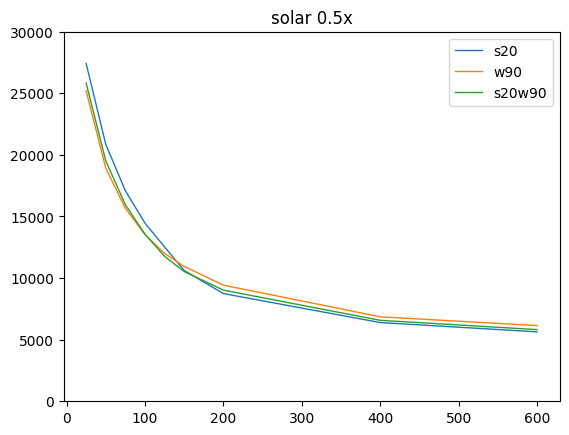

In [14]:
pd.options.plotting.backend='matplotlib'

results[['s20','w90','s20w90']].plot(title='solar 0.5x',
                                     linewidth=1,
                                     ylim=[0,30000],);

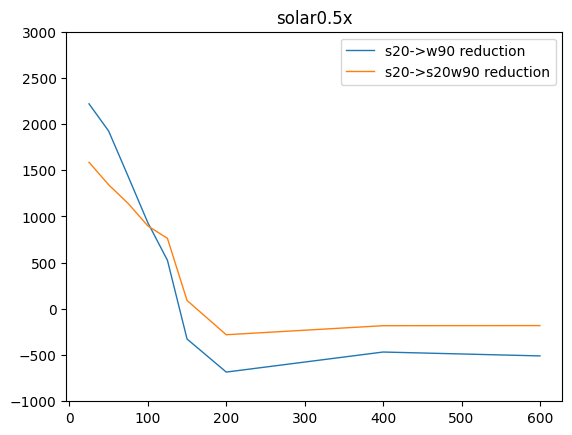

In [15]:
results[['s20->w90 reduction','s20->s20w90 reduction']].plot(title='solar0.5x',
                                                             linewidth=1,
                                                             ylim=[-1000,3000]);

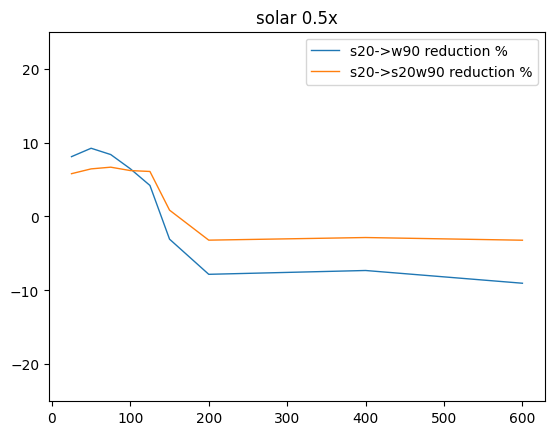

In [16]:
results[['s20->w90 reduction %','s20->s20w90 reduction %']].plot(title='solar 0.5x',
                                                                 linewidth=1,
                                                                 ylim=[-25,25],);

# Etc

In [ ]:
r[['deltac']][k:].dropna().rolling(100).std().plot()

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th0',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th1',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th2',y='c',color='i',width=800,height=400)

In [ ]:
r.loc[k+1:][['th0','th1','c']].plot.scatter(x='th0',y='th1',color='c')

In [ ]:
r.loc[k+1:][['th0','th2','c']].plot.scatter(x='th0',y='th2',color='c')

# CF Shape

In [ ]:
import numpy as np

TH0 = np.empty((500,3))
TH0

array([[6.95171738e-310, 6.95171738e-310, 4.68937172e-310],
       [4.68937172e-310, 4.94065646e-324, 4.68937172e-310],
       [4.94065646e-324, 4.68937172e-310, 6.95165821e-310],
       ...,
       [6.95171692e-310, 6.95163184e-310, 6.95171692e-310],
       [6.95163184e-310, 6.95171692e-310, 6.95163184e-310],
       [6.95171692e-310, 6.95163180e-310, 6.95171692e-310]])

In [ ]:
import numpy as np

def shuffle_along_axis(a, axis=0):
    idx = np.random.rand(*a.shape).argsort(axis=axis)
    return np.take_along_axis(a,idx,axis=axis)


th012_values = np.empty((50**3,3))

i = 0
for th0 in [x for x in range(50)]:
    for th1 in [x for x in range(50)]:
        for th2 in [x for x in range(50)]:
            th012_values[i,0] = th0
            th012_values[i,1] = th1
            th012_values[i,2] = th2
            i += 1
            
th012_values = shuffle_along_axis(th012_values)

TH0 =  np.empty(50**3)
TH1 =  np.empty(50**3)
TH2 =  np.empty(50**3)
C =    np.empty(50**3)
FAIL = np.empty(50**3)

angle = 's20'
_df = df.loc[year_month][['load',f'solar_{angle}',f'netload_{angle}']].copy(deep=True)

for i in range(len(th012_values)):
    th0 = th012_values[i,0]
    th1 = th012_values[i,1]
    th2 = th012_values[i,2]

    if (th0>=th1) and (th0>=th2):
        fail,dispatch = peak_shaving_sim(   _df,
                                            f'netload_{angle}',
                                            100,
                                            [th0,th1,th2],
                                            TOU,
                                            utility_chg_max=100,)                
        cost = calc_power_cost(dispatch.utility,TOU)
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = cost
        FAIL[i] = fail
        #print(i,th0,th1,th2,cost,fail)
    else:
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = np.nan
        FAIL[i] = np.nan
        #print(i,th0,th1,th2,np.nan,np.nan)

In [ ]:
pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL}).to_csv('CFshape.csv')

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r, x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r[r.th2==0], x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from scipy.interpolate import griddata


#df = pd.read_csv('./test_data.csv')

rth01 = r[r.th2==0]

x = np.array(rth01.th0)
y = np.array(rth01.th1)
z = np.array(rth01.c)


xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)

X,Y = np.meshgrid(xi,yi)

Z = griddata((x,y),z,(X,Y), method='cubic')

fig = go.Figure(go.Surface(x=xi,y=yi,z=Z))
fig.show()

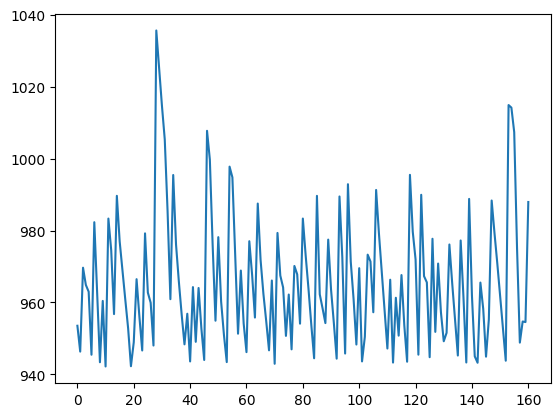

In [ ]:
plt.plot(c)

In [ ]:
r = pd.read_csv('CFshape.csv',index_col=0)
r = r[r.th2==0]
r = r.sort_values(['th0','th1'])
#r = r.sort_values('th1')
r.head(25)

,th0,th1,th2,c,fail
108640,0.0,0.0,0.0,2539.724706,1.0
82092,0.0,2.0,0.0,NaN,NaN
102988,0.0,2.0,0.0,NaN,NaN
82222,0.0,3.0,0.0,NaN,NaN
109015,0.0,3.0,0.0,NaN,NaN
74508,0.0,5.0,0.0,NaN,NaN
116422,0.0,5.0,0.0,NaN,NaN
49728,0.0,7.0,0.0,NaN,NaN
39407,0.0,8.0,0.0,NaN,NaN
85,0.0,9.0,0.0,NaN,NaN


MemoryError: Unable to allocate 4.55 TiB for an array with shape (250000000, 2500) and data type float64

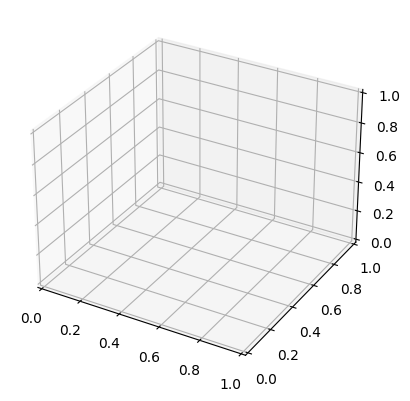

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import cm
from matplotlib.ticker import LinearLocator

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

r = pd.read_csv('CFshape.csv')

# Make data.
X = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th0)
Y = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th1)
X, Y = np.meshgrid(X, Y)
#R = np.sqrt(X**2 + Y**2)
#Z = np.sin(R)
Z = np.array(r[r.th2==0].c)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
#ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()